# Voluntario II: Ecuación de Schrodinger. Oscilador armónico cuántico

## Animación función densidad de probabilidad

In [64]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# --- PARÁMETROS DE LA RED  ---
L = 1.0
N = 1000
x = np.linspace(0, L, N + 1) # Creamos el vector de posiciones 
dt_guardado = 0.0001 * 50  # Tiempo real ya que guardamos saltando de 50 en 50

# Leemos los datos
probabilidad = np.loadtxt("evolucion_probabilidad_gaussiana_03_ancho_16.dat")

# --- CONFIGURACION DE LA GRAFICA ----
fig, ax = plt.subplots(figsize=(7, 4.5))

# Inicializamos la linea con el instante inicial
line, = ax.plot(x, probabilidad[0, :], color="black", lw=2, label=r"$|\phi(x,t)|^2$")

# Ajustamos los ejes
ax.set_xlim(0, L) 
ax.set_ylim(0, np.max(probabilidad) * 1.1) 
ax.grid(True, linestyle=":", alpha=0.6)
ax.legend(loc="upper right")
ax.set_xlabel("Posición (x)")
ax.set_ylabel("Densidad de probabilidad")
title = ax.set_title("")

# ---ANIMACION-----
def update(frame):
    # En cada frame, reemplazo los datos del eje Y con la fila siguiente (marcada por frame)
    line.set_ydata(probabilidad[frame, :])

    # Calculamos el tiempo real multiplicando el frame actual por el diferencial de tiempo
    tiempo_actual = frame * dt_guardado

    # Actualizamos el título para ver en tiempo real en cada frame
    title.set_text(f" Tiempo: {tiempo_actual:.3f} ")
    return line, title


ani = FuncAnimation(fig, update, frames=probabilidad.shape[0], interval=100, blit=True)
ani.save("animacion_probabilidad_gaussiana_05_ancho_16.gif", writer="pillow", fps=10)
plt.close(fig)

HTML(ani.to_jshtml())

## Animación de la parte real e imaginaria

In [62]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# --- PARÁMETROS DE LA RED ---
L = 1.0
N = 1000
x = np.linspace(0, L, N + 1) # Creamos el vector de posiciones y lo inicializamos a cero
dt_guardado = 0.0001 * 50  # Tiempo real ya que guardamos saltando de 50 en 50

# Leemos los datos
fases = np.loadtxt("evolucion_fases_gaussiana_03_ancho_16.dat")
num_frames = fases.shape[0] # Definimos el numero de frames como el tamaño de una de las columnas

# Guardamos la parte real e imaginaria
parte_real = fases[:, 0::2] # Empezamos en la columna 0 y avanzamos de dos en dos
parte_imag = fases[:, 1::2] # Empezamos en la columna 1 y avanzamos de dos en dos


# --- CONFIGURACION DE LA GRAFICA ----

fig, ax = plt.subplots(figsize=(7, 4.5))
line_real, = ax.plot(x, parte_real[0, :], color="#e74c3c", lw=1.5, label=r"$Re[\phi(x,t)]$")
line_imag, = ax.plot(x, parte_imag[0, :], color="#3498db", lw=1.5, label=r"$Im[\phi(x,t)]$")
title = ax.set_title("", fontsize=11)

ax.set_xlabel("Posición (x)")
ax.set_ylabel("Amplitud de la Función de Onda")
ax.set_xlim(0, L)

# Definimos el limite del eje y usando la amplitud máxima
lim_y = np.max(np.abs(fases)) * 1.1
ax.set_ylim(-lim_y, lim_y)
ax.grid(True, linestyle=":", alpha=0.6)
ax.legend(loc="upper right")

#----ACTUALIZACIÓN-----
def update(frame):
    line_real.set_ydata(parte_real[frame, :])
    line_imag.set_ydata(parte_imag[frame, :])
    tiempo_actual = frame * dt_guardado
    title.set_text(f"Funciones de Onda (Fases)  | Tiempo: {tiempo_actual:.3f} ")
    return line_real, line_imag, title


ani = FuncAnimation(fig, update, frames=num_frames, interval=80, blit=True)
ani.save("animacion_fases_gaussiana_03_ancho_16.gif", writer="pillow", fps=10)
plt.close(fig)


HTML(ani.to_jshtml())

### Representación conjunta de la densidad de probabilidad y parte real e imaginaria de la onda (Autofunciones)

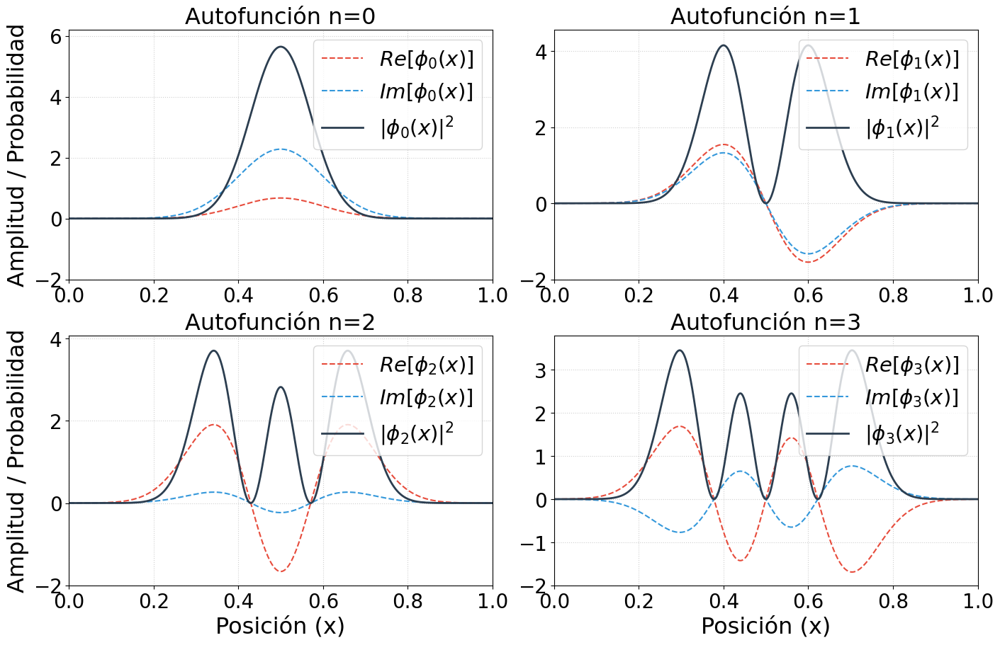

In [17]:
import numpy as np
import matplotlib.pyplot as plt

# --- PARÁMETROS ---
L = 1.0
N = 1000
x = np.linspace(0, L, N + 1) # Creamos el vector de posiciones 
frame_objetivo = 10 # Frame que queremos representar


# Emparejamos los archivos de probabilidad y fases para cada autofuncion
archivos = [
    ("evolucion_fases_autofuncion_0.dat", "evolucion_probabilidad_autofuncion_0.dat"),
    ("evolucion_fases_autofuncion_1.dat", "evolucion_probabilidad_autofuncion_1.dat"),
    ("evolucion_fases_autofuncion_2.dat", "evolucion_probabilidad_autofuncion_2.dat"),
    ("evolucion_fases_autofuncion_3.dat", "evolucion_probabilidad_autofuncion_3.dat")
]


# --- CONFIGURACION DE LA GRAFICA ----
fig, axes = plt.subplots(2, 2, figsize=(14, 9), constrained_layout=True)
axes = axes.flatten()

for i, (archivo_fases, archivo_prob) in enumerate(archivos):

    #Leemos los datos de las fases
    fases= np.loadtxt(archivo_fases)
    p_real = fases[frame_objetivo, 0::2]
    p_imag = fases[frame_objetivo, 1::2]
    
    #Leemos los datos de la probabilidad
    prob= np.loadtxt(archivo_prob)
    probabilidad = prob[frame_objetivo, :]
    
    # --- Dibujamos las tres curvas juntas ---
    axes[i].plot(x, p_real, color="#e74c3c", lw=1.5, linestyle="--", label=rf"$Re[\phi_{i}(x)]$")
    axes[i].plot(x, p_imag, color="#3498db", lw=1.5, linestyle="--", label=rf"$Im[\phi_{i}(x)]$")
    axes[i].plot(x, probabilidad, color="#2c3e50", lw=2, label=rf"$|\phi_{i}(x)|^2$")
    
    # Configuramos los ejes
    axes[i].set_title(f"Autofunción n={i}", fontsize=23)
    axes[i].set_xlim(0, L)
    axes[i].tick_params(axis='both', which='major', labelsize=20)
    axes[i].grid(True, linestyle=":", alpha=0.6)
    
    # Leyenda
    axes[i].legend(loc="upper right", fontsize=21)
    
    # Definimos los limites del eje y dependiendo del valor del maximo de la probabilidad o las fases
    max_fases = np.max(np.abs(fases[frame_objetivo, :]))
    max_prob = np.max(probabilidad)
    lim_y = max(max_fases, max_prob) * 1.1
    axes[i].set_ylim(-2, lim_y)
    
    # Solo ponemos los labels al eje x a las dos figuras de abajo
    if i >= 2: axes[i].set_xlabel("Posición (x)", fontsize=23)
    # Solo ponemos los labels al eje y a las dos figuras de la izquierda
    if i % 2 == 0: axes[i].set_ylabel("Amplitud / Probabilidad", fontsize=23)
   


#plt.savefig("comparativa_completa_autofuncion.png", dpi=600)

plt.show()

### Representación conjunta de la densidad de probabilidad y parte real e imaginaria de la onda (Gaussiana)

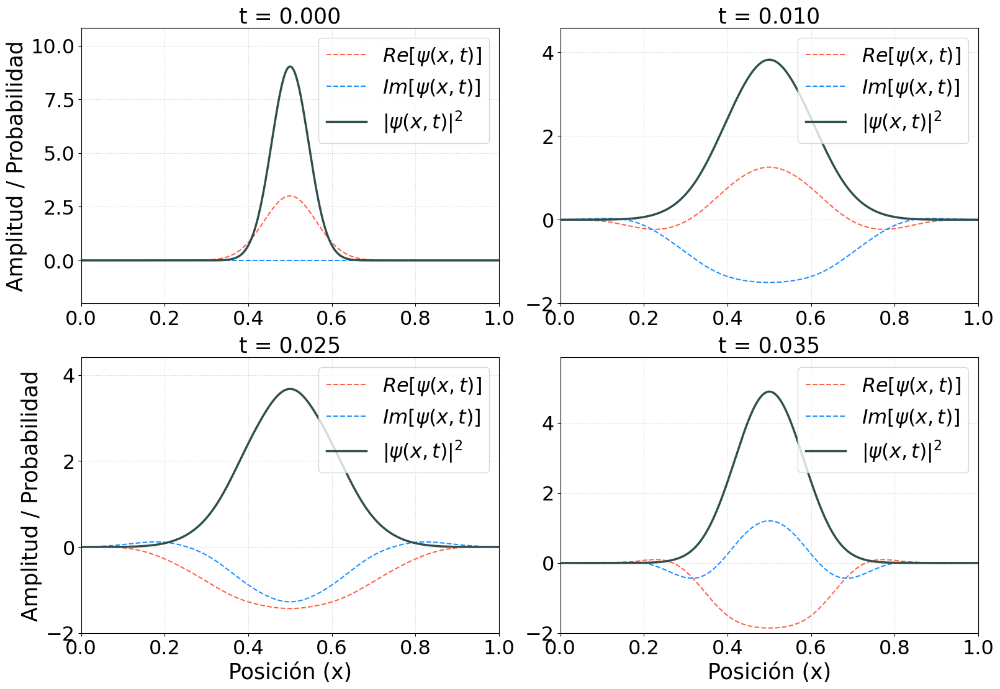

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# --- PARÁMETROS DEL ESPACIO Y TIEMPO ---
L = 1.0  
N = 1000 
x = np.linspace(0, L, N + 1) # Creamos el vector de posiciones y lo inicializamos a cero
dt_guardado = 0.0001 * 50  # Tiempo real ya que guardamos saltando de 50 en 50

# Definimos los archivos
archivo_fases = "evolucion_fases_gaussiana_05_ancho_16.dat" 
archivo_prob = "evolucion_probabilidad_gaussiana_05_ancho_16.dat" 

# Los leemos
fases = np.loadtxt(archivo_fases)
prob = np.loadtxt(archivo_prob) 

# Elegimos los frames que queremos representar
frames_a_representar = [0, 2, 5, 7] 

# --- CONFIGURACION DE LA GRAFICA ----
fig, axes = plt.subplots(2, 2, figsize=(16, 11), constrained_layout=True)
axes = axes.flatten()

# Creamos un bucle para representar cada frame que hemos elegido
for i, frame in enumerate(frames_a_representar):

    # Calculamos el tiempo real
    tiempo_real = frame * dt_guardado
    
    # Separamos la parte real e imaginaria
    p_real = fases[frame, 0::2]
    p_imag = fases[frame, 1::2]
    
    # Leemos la probabilidad
    probabilidad = prob[frame, :]
    
    # --- Dibujamos las tres curvas juntas----
    axes[i].plot(x, p_real, color="tomato", lw=1.5, linestyle="--", label=r"$Re[\psi(x,t)]$")
    axes[i].plot(x, p_imag, color="dodgerblue", lw=1.5, linestyle="--", label=r"$Im[\psi(x,t)]$")
    axes[i].plot(x, probabilidad, color="darkslategray", lw=2.5, label=r"$|\psi(x,t)|^2$")
    
    # Configuramos los ejes
    axes[i].set_title(f" t = {tiempo_real:.3f} ", fontsize=25)
    axes[i].set_xlim(0, L)
    axes[i].tick_params(axis='both', which='major', labelsize=23)
    axes[i].grid(True, linestyle=":", alpha=0.6)
    axes[i].legend(loc="upper right", fontsize=23)
    
    # --- AJUSTE DINÁMICO DEL EJE Y ---
    # Definimos los limites del eje y dependiendo del valor del maximo de la probabilidad o las fases
    lim_y_fases = np.max(np.abs(fases[frame, :]))
    lim_y_prob = np.max(probabilidad)
    lim_y = max(lim_y_fases, lim_y_prob) * 1.2
    axes[i].set_ylim(-2, lim_y)
    
    # Solo ponemos los labels al eje x a las dos figuras de abajo
    if i >= 2: 
        axes[i].set_xlabel("Posición (x)", fontsize=25)
        
    # Solo ponemos los labels al eje y a las dos figuras de la izquierda
    if i % 2 == 0: 
        axes[i].set_ylabel("Amplitud / Probabilidad", fontsize=25)


#plt.savefig("evolucion_gaussiana_completa_05.png", dpi=300)

# Mostramos el resultado en pantalla
plt.show()

## Representación de la norma

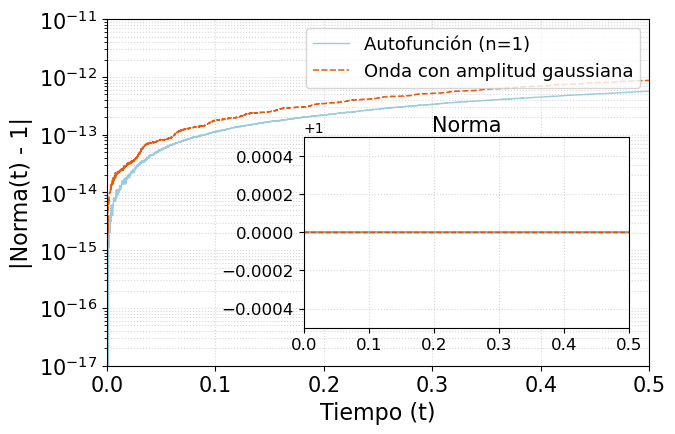

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Cargamos los datos
archivo1 = "observables_autofuncion_1.dat"
archivo2 = "observables_gaussiana_03_ancho_16.dat"

datos1 = np.loadtxt(archivo1)
datos2 = np.loadtxt(archivo2)

# De cada archivo extraemos el tiempo y la norma calculada 
t1, norma1 = datos1[:, 0], datos1[:, 1]
t2, norma2 = datos2[:, 0], datos2[:, 1]

# Configuramos el gráfico principal en escala logaritmica
fig, ax = plt.subplots(figsize=(7, 4.5)) 

# Calculamos el error absoluto respecto al 1 teórico
error1 = np.abs(norma1 - 1.0)
error2 = np.abs(norma2 - 1.0)

# Graficamos los errores 
ax.plot(t1, error1, color='#0083b0', lw=1.0, alpha=0.4, label="Autofunción (n=1)", zorder=1)
ax.plot(t2, error2, color="#e65100", lw=1.1, linestyle=(0, (4, 1.5)), alpha=0.95, label="Onda con amplitud gaussiana", zorder=2)

# Configuramos las escalas
ax.set_yscale('log')
ax.set_xlabel("Tiempo (t)", fontsize=16)
ax.set_ylabel(r'|Norma(t) - 1|', fontsize=16)
ax.set_xlim(0, 0.5)
ax.set_ylim(1e-17, 1e-11) 

ax.grid(True, which="both", linestyle=":", alpha=0.5)
ax.tick_params(axis='both', which='both', labelsize=15)
ax.legend(loc="upper right", fontsize=13)

# Creamos el inset para meter la representación de la norma
ax_inset = inset_axes(ax, width="60%", height="55%", loc=3, bbox_to_anchor=(0.35, 0.09, 1, 1), bbox_transform=ax.transAxes)

# Graficamos 
ax_inset.plot(t1, norma1, color='#0083b0', lw=2, alpha=0.5)
ax_inset.plot(t2, norma2, color="#e65100", lw=1, linestyle='--')

# Configuración del inset
ax_inset.set_title("Norma", fontsize=15, pad=4)
ax_inset.set_xlim(0, 0.5)
ax_inset.set_ylim(0.9995, 1.0005) 

ax_inset.grid(True, linestyle=":", alpha=0.5)
ax_inset.tick_params(axis='both', which='major', labelsize=12)


#plt.savefig("error_norma.png", dpi=600)

plt.show()
plt.close()

## Representación de los valores esperados de la posición y el momento

### Caso de la autofunción n=1

  Diferencia <x> = 2.85993e-13
  Diferencia <p> = 6.08000e-13


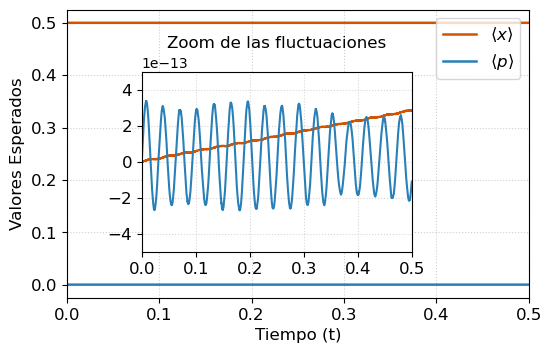

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Cargamos los datos
datos = np.loadtxt("observables_autofuncion_1.dat")

# Extraemos el tiempo, el valor esperado de la posición y del momento.
t = datos[:, 0]
esp_x = datos[:, 2]
esp_p = datos[:, 3] 

# Calculamos la diferencia entre el valor máximo y mínimo para ver cuánto han oscilado
diff_x = np.max(esp_x) - np.min(esp_x)
diff_y = np.max(esp_p) - np.min(esp_p)

# Lo mostramos en pantalla
print(f"  Diferencia <x> = {diff_x:.5e}")
print(f"  Diferencia <p> = {diff_y:.5e}")


# --- CONFIGURACION DE LA GRAFICA ----

fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(t, esp_x, color='#d35400', lw=1.8, label=r"$\langle x \rangle$")
ax.plot(t, esp_p, color='#2980b9', lw=1.8, label=r"$\langle p \rangle$")
ax.set_xlabel("Tiempo (t)", fontsize=12)
ax.set_ylabel("Valores Esperados", fontsize=12)
ax.set_xlim(0, np.max(t))
ax.grid(True, linestyle=":", alpha=0.6)
ax.legend(loc="lower left")
ax.tick_params(axis='both', labelsize=12)
ax.legend(loc="upper right", fontsize=12)

ax.set_position([0.15, 0.16, 0.77, 0.72]) # [izquierda, abajo, ancho, alto]

# --- GRAFICA ZOOM ------
ax_zoom = plt.axes([0.275, 0.275, 0.45, 0.45])  # [izquierda, abajo, ancho, alto]

# Restamos el primer valor para que ambas empiecen en 0
fluct_x = esp_x - esp_x[0]
fluct_p = esp_p - esp_p[0]

# Dibujamos las fluctuaciones dentro del zoom 
ax_zoom.plot(t, fluct_x, color='#d35400', lw=1.5)
ax_zoom.plot(t, fluct_p, color='#2980b9', lw=1.5) 

ax_zoom.set_title(r"Zoom de las fluctuaciones", fontsize=12)
ax_zoom.grid(True, linestyle=":", alpha=0.5)
ax_zoom.set_xlim(0, np.max(t) )
ax_zoom.tick_params(axis='both', labelsize=12)


# Forzamos los límites del eje y del zoom a un rango muy pequeño
orden_zoom = 5e-13
ax_zoom.set_ylim(-orden_zoom, orden_zoom)


#plt.savefig("observable_ehrenfest_autofuncion1.png", dpi=600)

plt.show()

### Paquete gaussiano

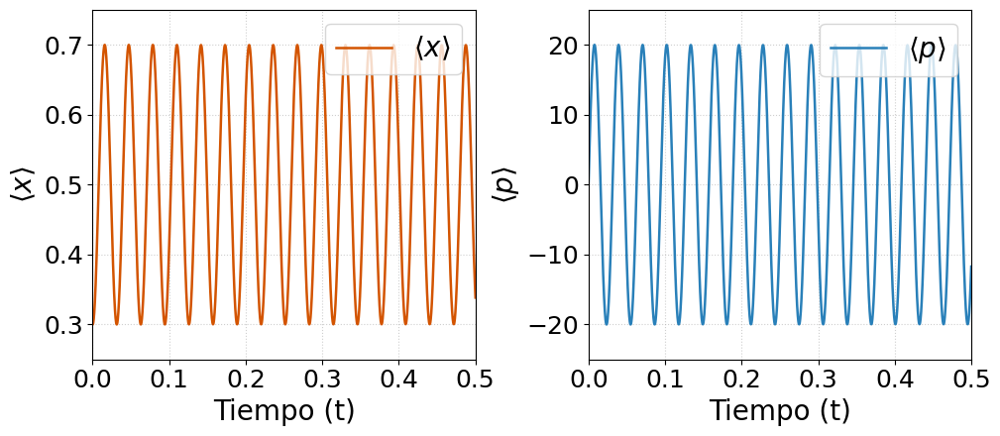

In [23]:
import numpy as np
import matplotlib.pyplot as plt


# Cargamos los datos
datos = np.loadtxt("observables_gaussiana_03_ancho_16.dat")

# Extraemos el tiempo, el valor esperado de la posición y del momento.
t = datos[:, 0]
esp_x = datos[:, 2]
esp_p = datos[:, 3] 


# Creamos una figura con 1 fila y 2 columnas
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4.5))

# --- GRÁFICA DE LA IZQUIERDA: POSICIÓN ---
ax1.plot(t, esp_x, color='#d35400', lw=1.8, label=r"$\langle x \rangle$")
ax1.set_xlabel("Tiempo (t)", fontsize=20)
ax1.set_ylabel(r"$\langle x \rangle$", fontsize=20)
ax1.set_xlim(0, np.max(t))
ax1.set_ylim(0.25, 0.75) 
ax1.grid(True, linestyle=":", alpha=0.6)
ax1.legend(loc="upper right", fontsize=20)
ax1.tick_params(axis='both', labelsize=18)

# --- GRÁFICA DERECHA: MOMENTO ---
ax2.plot(t, esp_p, color='#2980b9', lw=1.8, label=r"$\langle p \rangle$")
ax2.set_xlabel("Tiempo (t)", fontsize=20)
ax2.set_ylabel(r"$\langle p \rangle$", fontsize=20)
ax2.set_xlim(0, np.max(t))
ax2.set_ylim(-25, 25)  
ax2.grid(True, linestyle=":", alpha=0.6)
ax2.legend(loc="upper right", fontsize=20)
ax2.tick_params(axis='both', labelsize=18)


plt.tight_layout()

# Guardar y mostrar
#plt.savefig("observable_ehrenfest_gaussiana_03_2.png", dpi=600)
plt.show()

plt.close()



## Conservación de la energía 

### Autofunciones

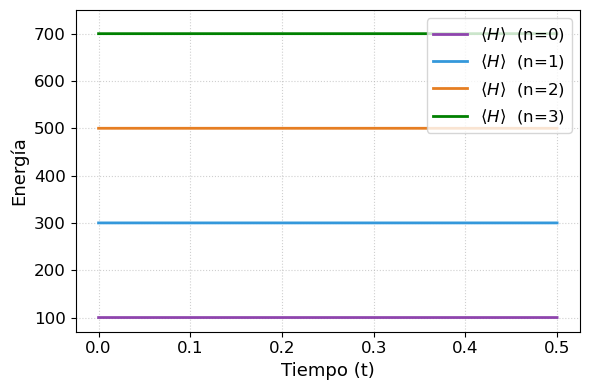

In [29]:
import numpy as np
import matplotlib.pyplot as plt


colores = ['#8e44ad', '#3498db', '#e67e22', 'green']
archivos = [
    "observables_autofuncion_0.dat", 
    "observables_autofuncion_1.dat", 
    "observables_autofuncion_2.dat", 
    "observables_autofuncion_3.dat"
]

# Creamos la figura
fig, ax = plt.subplots(figsize=(6, 4))

# --- Bucle para graficar cada nivel ----
for i in range(4):
    datos = np.loadtxt(archivos[i])
    t = datos[:, 0]
    esp_H = datos[:, 4]
    ax.plot(t, esp_H, color=colores[i], lw=2, label=fr"$\langle H \rangle$  (n={i})")


# --- CONFIGURACION DE LA GRAFICA ----
#ax.set_title("<H>", fontsize=12, fontweight='bold', color='green')
ax.set_xlabel("Tiempo (t)" , fontsize=13)
ax.set_ylabel("Energía",  fontsize=13)
ax.set_ylim(70,750)
ax.grid(True, linestyle=":", alpha=0.6)
ax.legend(loc="upper right",  fontsize=12)
ax.tick_params(axis='both', labelsize=12)

plt.tight_layout()

#plt.savefig("observable_energia_autofuncion.png", dpi=300)
plt.show()

plt.close()


### Energía para la gaussiana


Diferencia (Máx - Mín): 5.28757482e-10



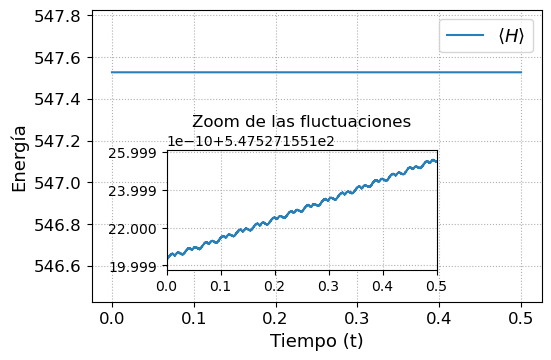

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Cargamos los datos
datos = np.loadtxt("observables_gaussiana_03_ancho_16.dat")
t = datos[:, 0]
esp_H = datos[:, 4]

# --- Calculamos las fluctuaciones----
h_max = np.max(esp_H)
h_min = np.min(esp_H)
delta_H_max_min = h_max - h_min
H_mean = np.mean(esp_H)

print(f"\nDiferencia (Máx - Mín): {delta_H_max_min:.8e}\n")

# --- GRÁFICA  ---
fig, ax1 = plt.subplots(figsize=(6, 4))

ax1.plot(t, esp_H, color='#2980b9', label=r"$\langle H \rangle$")
#ax1.set_title("Valor Esperado de la Energía")
ax1.set_xlabel("Tiempo (t)", fontsize=13)
ax1.set_ylabel("Energía", fontsize=13)
ax1.set_ylim(H_mean - 1.1, H_mean + 0.3)
ax1.grid(True, linestyle=":")
ax1.legend(loc="upper right",  fontsize=13)
ax1.tick_params(axis='both', labelsize=12)

# --- INSET (zoom)-------
ax2 = fig.add_axes([0.275, 0.23, 0.45, 0.30])

ax2.plot(t, esp_H, color='#2980b9')
ax2.set_title("Zoom de las fluctuaciones")
ax2.set_xlim(t[0], t[-1]) #representamos todo el tiempo
ax2.set_ylim(h_min - 0.1*delta_H_max_min, h_max + 0.1*delta_H_max_min)
ax2.grid(True, linestyle=":")
ax2.tick_params(labelsize=10)
plt.subplots_adjust(left=0.15, bottom=0.15)


#plt.savefig("observable_energia_gaussiana.png", dpi=300)


plt.show()

## Principio de Incertidumbre 

### Autofunciones 

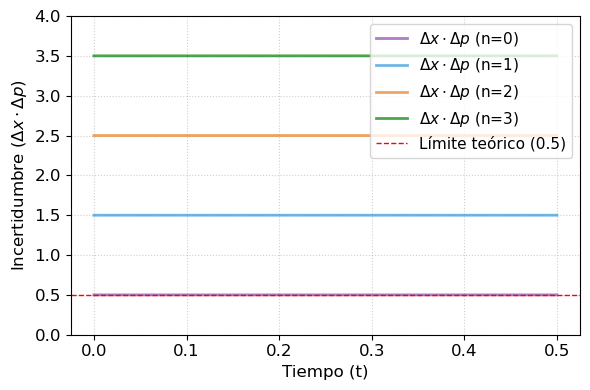

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# Hacemos una lista con los colores y archivos

colores = ['#8e44ad', '#3498db', '#e67e22', 'green']
archivos = [
    "observables_autofuncion_0.dat", 
    "observables_autofuncion_1.dat", 
    "observables_autofuncion_2.dat", 
    "observables_autofuncion_3.dat"
]

#---- GRÁFICA------
fig, ax = plt.subplots(figsize=(6, 4))

# Bucle para recorrer todos los archivos
for i in range(4):
    datos = np.loadtxt(archivos[i])
    t = datos[:, 0]
    
    # Los datos de la incertidumbre estan en la columna 5
    incertidumbre = datos[:, 5]
    
    # Graficamos la línea correspondiente 
    ax.plot(t, incertidumbre, color=colores[i], lw=2, alpha=0.7, label=fr"$\Delta x \cdot \Delta p$ (n={i})")

# Dibujamos una linea para marcar el limite teorico
ax.axhline(y=0.5, color='red', linestyle='--', lw=1, label='Límite teórico (0.5)')

# Configuramos el gráfico
ax.set_xlabel("Tiempo (t)", fontsize=12)
ax.set_ylabel(r"Incertidumbre ($\Delta x \cdot \Delta p$)", fontsize=12)
ax.set_ylim(0, 4.0)
ax.grid(True, linestyle=":", alpha=0.6)
ax.legend(loc="upper right", fontsize=11)
ax.tick_params(axis='both', labelsize=12)

plt.tight_layout()


#plt.savefig("incertidumbre_heisenberg_autofuncion.png", dpi=400, bbox_inches='tight')
plt.show()

plt.close()


### Gaussiana

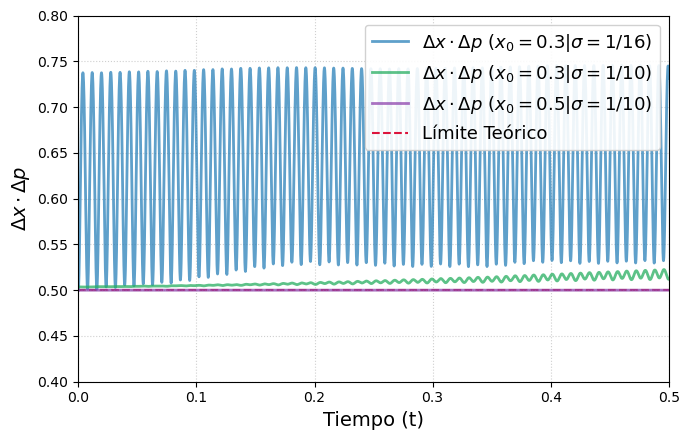

In [34]:
import numpy as np
import matplotlib.pyplot as plt



# Creamos una lista con los archivos
archivos = [
    "observables_gaussiana_03_ancho_16.dat",
    "observables_gaussiana_03_ancho_10.dat",
    "observables_gaussiana_05_ancho_10.dat"
]

etiquetas = [
    r"$\Delta x \cdot \Delta p$ ($x_0=0.3 | \sigma=1/16$)",
    r"$\Delta x \cdot \Delta p$ ($x_0=0.3 | \sigma=1/10$)",
    r"$\Delta x \cdot \Delta p$ ($x_0=0.5 | \sigma=1/10$)"
]


colores = ['#2980b9', '#27ae60', '#8e44ad']  

#---- GRÁFICA------
fig, ax = plt.subplots(figsize=(7, 4.5))

max_t = 0
max_incertidumbre = 0.5 # Empezamos en el límite teórico

# Bucle para recorrer todos los archivos
for i, archivo in enumerate(archivos):
    datos = np.loadtxt(archivo)
    t = datos[:, 0]
    incertidumbre = datos[:, 5] 
    
    # Graficamos la línea correspondiente 
    ax.plot(t, incertidumbre, color=colores[i], lw=2.0, alpha=0.75, label=etiquetas[i])

# Graficamos el limite teórico
ax.axhline(y=0.5, color='crimson', linestyle='--', lw=1.5, label="Límite Teórico", zorder=1)

# Configuramos el gráfico
ax.set_xlabel("Tiempo (t)", fontsize=14)
ax.set_ylabel(r"$\Delta x \cdot \Delta p$", fontsize=14)
ax.set_xlim(0, 0.5)
ax.set_ylim(0.4, 0.8)
ax.grid(True, linestyle=":", alpha=0.6)
ax.legend(loc="upper right", fontsize=13, framealpha=0.9)

plt.tight_layout()


#plt.savefig("observable_incertidumbre_comparativa.png", dpi=600)

plt.show()
plt.close()


## Principio de correspondencia de Bohr

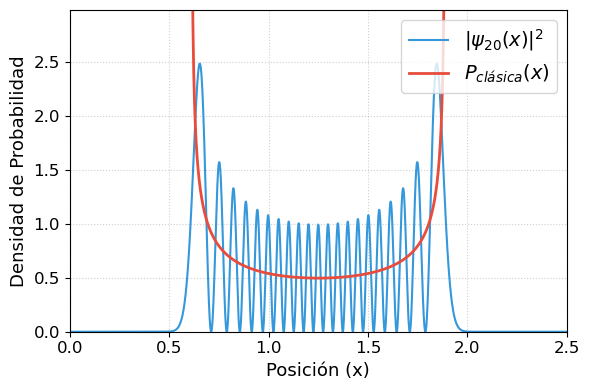

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# --- PARÁMETROS ---
L = 2.5
N = 2000
x = np.linspace(0, L, N + 1)
frame_objetivo = 0

# --- PARÁMETROS DEL OSCILADOR 
n = 20          # Nivel cuántico
omega = 200     # Frecuencia angular 
x_centro = L/2  # Centro del potencial (L / 2)

# Calculamos la energía del estado n=20 y la amplitud clásica 
E_n = omega * (n + 0.5)
A = np.sqrt(4 * E_n / (omega**2))  # Amplitud desde el centro

# Leemos el archivo
archivo = "evolucion_probabilidad_autofuncion_20.dat"

# Cargamos los datos
probabilidad= np.loadtxt(archivo)

# Guardamos la probabilidad
p_cuantica = probabilidad[frame_objetivo, :]

# ---- GRAFICA------
fig, ax = plt.subplots(figsize=(6, 4))

# Dibujamos la densidad de probabilidad cuántica
ax.plot(x, p_cuantica, color="#3498db", lw=1.5, label=r"$|\psi_{20}(x)|^2$")

# Dibujamos la probabilidad clásica
x_clasica = np.linspace(x_centro - A + 0.001, x_centro + A - 0.001, 1000) # Ponemos un margen de 0.001 para evitar que se anule el denominador
p_clasica = 1.0 / (np.pi * np.sqrt(A**2 - (x_clasica - x_centro)**2))

ax.plot(x_clasica, p_clasica, color="#e74c3c", lw=2, linestyle="-", label=r"$P_{clásica}(x)$")

# Configuramos el gráfico
ax.set_xlim(0, L)
ax.set_xlabel("Posición (x)", fontsize=13)
ax.set_ylabel("Densidad de Probabilidad", fontsize=13)
lim_y = np.max(p_cuantica) * 1.2
ax.set_ylim(0, lim_y)
ax.grid(True, linestyle=":", alpha=0.6)
ax.legend(loc="upper right", fontsize=14)
ax.tick_params(axis='both', which='major', labelsize=12)

plt.tight_layout()

#plt.savefig("probabilidad_autofuncion_20.png", dpi=600, bbox_inches='tight')

plt.show()

## Efecto Stark

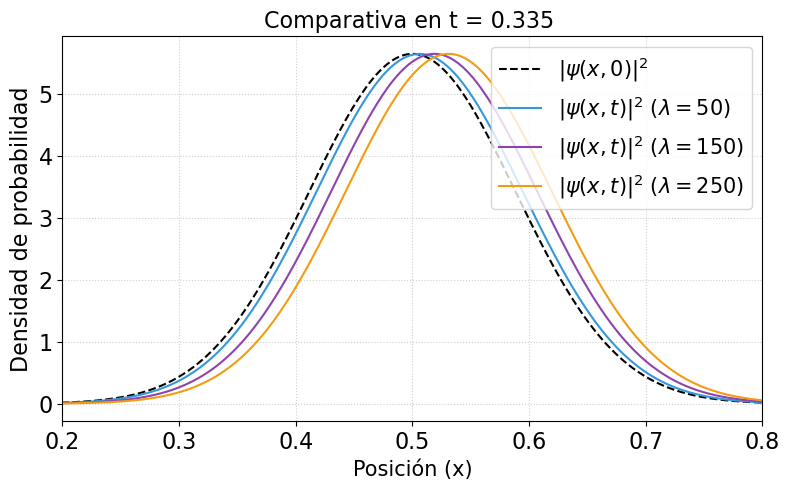

In [42]:
import numpy as np
import matplotlib.pyplot as plt

# --- PARÁMETROS ---
L = 1.0
N = 1000
x = np.linspace(0, L, N + 1)
dt_guardado = 0.0001 * 50  

# Tiempo físico que queremos congelar en la gráfica
tiempo_deseado = 0.335

# Traducimos el tiempo a número de fila
frame = int(tiempo_deseado / dt_guardado)


# Definimos las listas

archivos = [
    "evolucion_probabilidad_stark50.dat",
    "evolucion_probabilidad_stark150.dat",
    "evolucion_probabilidad_stark250.dat"
]

etiquetas = [
    r"$\lambda=50$",
    r"$\lambda=150$", 
    r"$\lambda=250$" 
]

# Lista de colores para cada lambda
colores = ["#3498db", "#8e44ad", "#f39c12", "#8e44ad"]


# --- CONFIGURACIÓN DE LA GRÁFICA ---
plt.figure(figsize=(8, 5))

# Graficamos el estado inicial de referencia en t=0 
prob_inicial = np.loadtxt(archivos[0])
plt.plot(x, prob_inicial[0, :], color="black", lw=1.5, linestyle="--", alpha=1, label=r"$|\psi(x,0)|^2$ ")


# --- Bucle para recorrer los archivos
for i, archivo in enumerate(archivos):
    # Cargamos los datos
    probabilidad = np.loadtxt(archivo)
    
    # Graficamos la fila que hemos fijado al determinar el tiempo
    plt.plot(x, probabilidad[frame, :], color=colores[i], 
             lw=1.5, label=fr"$|\psi(x, t)|^2$ ({etiquetas[i]})")


# Configuración del grafico
plt.title(f"Comparativa en t = {tiempo_deseado} ", fontsize=16)
plt.xlabel("Posición (x)", fontsize=15)
plt.ylabel("Densidad de probabilidad", fontsize=16)
plt.grid(True, linestyle=":", alpha=0.6)
plt.legend(loc="upper right", fontsize=15)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.xlim(0.2, 0.8)

plt.tight_layout()

#plt.savefig("comparativa_stark.png", dpi=600)
plt.show()